In [1]:
# Load modules
import sys
sys.path.append('../utilities_tlezuo/')

import matplotlib.pyplot as plt
import numpy as np
import sys
from pathlib import Path
import psyplot.project as psy
import pandas as pd
import xarray
from netCDF4 import Dataset,date2num
import xarray as xr
from matplotlib import cm
from wrf import getvar, interp1d
from netCDF4 import Dataset

from timefunctions import *
import varfunctions as vf
import locfunctions as lf
import datetime as dt

from iconarray.plot import formatoptions # import plotting formatoptions (for use with psyplot)
import iconarray as iconvis # import self-written modules from iconarray

###############################################################################################
# define class of pc_dict
class Point_coordinates:
    def __init__(self, shortname, name, color, marker, lat, lon, altitude, iconID, iconHSURF, iconHHL, iconHFL, height_dict):
        self.short = shortname
        self.name = name
        self.color = color
        self.marker = marker
        self.lat = lat
        self.lon = lon
        self.alt = altitude
        self.iconID = iconID 
        self.iconHSURF = iconHSURF
        self.iconHHL = iconHHL
        self.iconHFL = iconHFL
        self.hdict = height_dict 


# load pc_dict and its lists
pc_dict = np.load('../utilities_tlezuo/pc_dict.npy',allow_pickle=True).item()

INFO:numexpr.utils:Note: NumExpr detected 36 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


In [2]:
# ###############################################################################################
# ## CONSTANT FILE  ##
# c_filename = "lfff00000000c.nc"
# filepath = '/store/s83/swester/teamx/tdf_2019091212/output/19091212/'
# const_file = filepath + c_filename
# data_c = psy.open_dataset(const_file)

# ###############################################################################################
# ## DECIDE ##
# # where to save
# loadpath = '/users/tlezuo/icon-vis/height_time_diagrams/data/'
# # decide which locations to calculate
# loc_list = []
# # loc_list.extend([])
# loc_list=[pc_dict['kols']]

# # decide which variables to calculate
# pvars_list = []
# # pvars_list.extend([vf.qv_2m,vf.T_2M])
# pvars_list= [vf.U, vf.V, vf.T,vf.TH,vf.QV,vf.P,vf.VEL,vf.DIR]

# ###############################################################################################
# ## DATELISTS ##
# # ICON model: as writeout times: 30 min
# startdate_model = dt.datetime(2019,9,12,12,00)
# enddate_model = dt.datetime(2019,9,14,00,00)
# plotdates_model = pd.date_range(startdate_model,enddate_model,freq='0h30min')
# plotdates_model_list = list(plotdates_model)
# # radiosoundings: 3h and 2h intervals
# plotdates_rs = [dt.datetime(2019,9,12,23,00),dt.datetime(2019,9,13,3,00),dt.datetime(2019,9,13,6,00),dt.datetime(2019,9,13,9,00),
# dt.datetime(2019,9,13,11,00),dt.datetime(2019,9,13,13,00),dt.datetime(2019,9,13,15,00),dt.datetime(2019,9,13,17,00),dt.datetime(2019,9,13,20,00),dt.datetime(2019,9,13,23,00)]
# # radiosoundings Munich: 00+12
# plotdates_murs = [dt.datetime(2019,9,12,12,00),dt.datetime(2019,9,13,0,00),dt.datetime(2019,9,13,12,00),dt.datetime(2019,9,14,0,00)]
# # lidar SL88: 10 min
# plotdates_lidar_SL88 = pd.date_range(dt.datetime(2019,9,13,0,00),enddate_model,freq='0h10min')
# plotdates_lidar_SL88_list = list(plotdates_lidar_SL88)

In [3]:
# ## LOAD DATA ##
# # ICON model
# htd_data_model = {}
# htd_data_model['kols'] = np.load(loadpath+'htd_ICON_kols.npy',allow_pickle='TRUE').item()
# htd_data_model['murs'] = np.load(loadpath+'htd_ICON_murs.npy',allow_pickle='TRUE').item()
# htd_data_model['ifl'] = np.load(loadpath+'htd_ICON_ifl.npy',allow_pickle='TRUE').item()

# # Streamline Lidar SL88
# htd_data_lidar_SL88 = xr.open_dataset(loadpath+'htd_lidar_SL88_Kolsass.nc').load()
# htd_data_lidar_SL88_interp = np.load(loadpath+'htd_lidar_SL88_interp_Kolsass.npy',allow_pickle='TRUE').item()
# # Streamline Lidar SLXR142
# htd_data_lidar_SLXR142 = xr.open_dataset(loadpath+'htd_lidar_SLXR142_Kolsass.nc').load()
# # htd_data_lidar_SLXR142_interp = np.load(loadpath+'htd_lidar_SLXR142_interp_Kolsass.npy',allow_pickle='TRUE').item()
# # HATPRO Lidar
# htd_data_lidar_hatpro = xr.open_dataset(loadpath+'htd_lidar_hatpro_Kolsass.nc').load()
# htd_data_lidar_hatpro = htd_data_lidar_hatpro.transpose()

# # Kolsass radiosoundings
# htd_data_kolsrs = np.load(loadpath+'htd_rs_Kolsass.npy',allow_pickle='TRUE').item()
# htd_data_kolsrs_interp = np.load(loadpath+'htd_rs_interp_Kolsass.npy',allow_pickle='TRUE').item()
# # Munich radiosounding
# htd_data_murs = np.load(loadpath+'htd_rs_Munich.npy',allow_pickle='TRUE').item()
# htd_data_murs_interp = np.load(loadpath+'htd_rs_interp_Munich.npy',allow_pickle='TRUE').item()
# # Innsbruck radiosounding
# htd_data_iflrs = np.load(loadpath+'htd_rs_Innsbruck.npy',allow_pickle='TRUE').item()
# htd_data_iflrs_interp = np.load(loadpath+'htd_rs_interp_Innsbruck.npy',allow_pickle='TRUE').item()

In [4]:
###############################################################################################
## CONSTANT FILE  ##
c_filename = "lfff00000000c.nc"
filepath = '/store/s83/swester/teamx/tdf_2019091212/output/19091212/'
const_file = filepath + c_filename
data_c = psy.open_dataset(const_file)

###############################################################################################
## DECIDE ##
# where to save
loadpath = '/users/tlezuo/icon-vis/height_time_diagrams/data/'
# decide which locations to calculate
loc_list = []
# loc_list.extend([])
loc_list=[pc_dict['kols']]

# decide which variables to calculate
pvars_list = []
# pvars_list.extend([vf.qv_2m,vf.T_2M])
pvars_list= [vf.U, vf.V, vf.T,vf.TH,vf.QV,vf.P,vf.VEL,vf.DIR]

###############################################################################################
## LOAD DATA ##
# ICON model
htd_data_model = {}

# old data
# htd_data_model['kols'] = np.load(loadpath+'htd_ICON_kols.npy',allow_pickle='TRUE').item()
# htd_data_model['murs'] = np.load(loadpath+'htd_ICON_murs.npy',allow_pickle='TRUE').item()
# htd_data_model['ifl'] = np.load(loadpath+'htd_ICON_ifl.npy',allow_pickle='TRUE').item()
# enddate_model = dt.datetime(2019,9,14,00,00)

# new RUN5 data
htd_data_model['kols'] = np.load(loadpath+'htd_ICON_RUN5_extendedkols.npy',allow_pickle='TRUE').item()
htd_data_model['murs'] = np.load(loadpath+'htd_ICON_RUN5_extendedmurs.npy',allow_pickle='TRUE').item()
htd_data_model['ifl'] = np.load(loadpath+'htd_ICON_RUN5_extendedifl.npy',allow_pickle='TRUE').item()
htd_data_model['egg'] = np.load(loadpath+'htd_ICON_RUN5_extendedegg.npy',allow_pickle='TRUE').item()
htd_data_model['KUF'] = np.load(loadpath+'htd_ICON_RUN5_extendedKUF.npy',allow_pickle='TRUE').item()
htd_data_model['ROS'] = np.load(loadpath+'htd_ICON_RUN5_extendedROS.npy',allow_pickle='TRUE').item()
htd_data_model['terf'] = np.load(loadpath+'htd_ICON_RUN5_extendedterf.npy',allow_pickle='TRUE').item()
enddate_model = dt.datetime(2019,9,14,12,00)

# Streamline Lidar SR88
htd_data_lidar_SL88 = xr.open_dataset(loadpath+'htd_lidar_SL88_Kolsass.nc').load()
htd_data_lidar_SL88 = htd_data_lidar_SL88.transpose()
# Streamline Lidar SLXR142
htd_data_lidar_SLXR142 = xr.open_dataset(loadpath+'htd_lidar_SLXR142_Kolsass.nc').load()
# HATPRO Lidar
htd_data_lidar_hatpro = xr.open_dataset(loadpath+'htd_lidar_hatpro_Kolsass.nc').load()
htd_data_lidar_hatpro = htd_data_lidar_hatpro.transpose()
htd_data_lidar_hatpro['height'] = htd_data_lidar_hatpro['height'] + pc_dict['kols'].alt # set altitude asl. instead of agl.

# Kolsass radiosoundings
htd_data_kolsrs = np.load(loadpath+'htd_rs_Kolsass.npy',allow_pickle='TRUE').item()
htd_data_kolsrs_interp = np.load(loadpath+'htd_rs_interp_Kolsass.npy',allow_pickle='TRUE').item()
# Munich radiosounding
htd_data_murs = np.load(loadpath+'htd_rs_Munich.npy',allow_pickle='TRUE').item()
htd_data_murs_interp = np.load(loadpath+'htd_rs_interp_Munich.npy',allow_pickle='TRUE').item()
# Innsbruck radiosounding
htd_data_iflrs = np.load(loadpath+'htd_rs_Innsbruck.npy',allow_pickle='TRUE').item()
htd_data_iflrs_interp = np.load(loadpath+'htd_rs_interp_Innsbruck.npy',allow_pickle='TRUE').item()

###############################################################################################
## DATELISTS ##
# ICON model: as writeout times: 30 min
startdate_model = dt.datetime(2019,9,12,12,00)
plotdates_model = pd.date_range(startdate_model,enddate_model,freq='0h30min')
plotdates_model_list = list(plotdates_model)
# radiosoundings: 3h and 2h intervals
plotdates_rs = [dt.datetime(2019,9,12,23,00),dt.datetime(2019,9,13,3,00),dt.datetime(2019,9,13,6,00),dt.datetime(2019,9,13,9,00),
dt.datetime(2019,9,13,11,00),dt.datetime(2019,9,13,13,00),dt.datetime(2019,9,13,15,00),dt.datetime(2019,9,13,17,00),dt.datetime(2019,9,13,20,00),dt.datetime(2019,9,13,23,00)]
# radiosoundings Munich: 00+12
plotdates_murs = [dt.datetime(2019,9,12,12,00),dt.datetime(2019,9,13,0,00),dt.datetime(2019,9,13,12,00),dt.datetime(2019,9,14,0,00),dt.datetime(2019,9,14,12,00)]
# radiosoundings Innsbruck: 02+02
plotdates_ifl = [dt.datetime(2019,9,13,2,00),dt.datetime(2019,9,14,2,00)]
# lidar SR88: 10 min
plotdates_lidar = pd.date_range(dt.datetime(2019,9,12,00,00),dt.datetime(2019,9,14,23,50),freq='0h10min')
plotdates_lidar_list = list(plotdates_lidar)

In [5]:
###############################################################################################
## MY FUNCTIONS ##
def get_sounding(pvar,pdate,loc):
    # model levels
    lev_model = htd_data_model[loc.short]['HFL_loc']
    lev_model_cut = lev_model[0:73]

    # indices for model
    ti_model = plotdates_model_list.index(pdate)

    # get data model
    sounding_model = np.array(htd_data_model[loc.short][pvar.name][ti_model,:])
    sounding_model_cut = sounding_model[0:73]       

    if pdate.strftime('%H') == '02': # if 02 -> we want to see ifl sounding
        # index for rs Innsbruck is always 0
        ti_rs = plotdates_ifl.index(pdate)
        sounding_rs_interp = np.array(htd_data_iflrs_interp[pvar.name][ti_rs,:])
    
    elif pdate.strftime('%H') == '12' or pdate.strftime('%H') ==  '00': # if 12 or 00 -> we want to see murs sounding
        # index for rs Munich
        ti_rs = plotdates_murs.index(pdate)
        sounding_rs_interp = np.array(htd_data_murs_interp[pvar.name][ti_rs,:])
    
    else: # else -> we want Kolsass/CROSSINN sounding
        # index for rs Kolsass
        ti_rs = plotdates_rs.index(pdate)
        sounding_rs_interp = np.array(htd_data_kolsrs_interp[pvar.name][ti_rs,:])
        # print(sounding_rs_interp)

    return lev_model_cut,sounding_model_cut,sounding_rs_interp,ti_model,ti_rs

def plot_sounding(pvar, pdate, loc, axis):

    lev_model_cut,sounding_model_cut,sounding_rs_interp,ti_model,ti_rs = get_sounding(pvar,pdate,loc)                                                                                          
    # plot it
    m = axis.plot(sounding_model_cut,  lev_model_cut, lw=2,color='dodgerblue',label='ICON')
    r = axis.plot(sounding_rs_interp,  lev_model_cut, lw=2,color='darkviolet',label='observations radiosoundings')
    # lidar
    if pvar.name == 'VEL' and loc.short == 'kols': 
        ti_lidar = plotdates_lidar_list.index(pdate)
        l = axis.plot(np.array(htd_data_lidar_SL88[pvar.name][:,ti_lidar]), htd_data_lidar_SL88.height, lw=2,color='violet',label='observations lidar SL88') 
        axis.quiver(np.full(83,15), htd_data_lidar_SL88.height, htd_data_lidar_SL88.U[:,ti_lidar], htd_data_lidar_SL88.V[:,ti_lidar], 
            scale=30, scale_units='inches', width=0.002,color='violet')
        axis.fill_betweenx(lev_model_cut, sounding_model_cut, sounding_rs_interp, where=(((sounding_model_cut < sounding_rs_interp) & (sounding_model_cut < interp1d(np.array(htd_data_lidar_SL88[pvar.name][:,ti_lidar]), htd_data_lidar_SL88.height, lev_model_cut)))), alpha=0.2, color='cyan')
        axis.fill_betweenx(lev_model_cut, sounding_model_cut, sounding_rs_interp, where=(((sounding_model_cut > sounding_rs_interp) & (sounding_model_cut > interp1d(np.array(htd_data_lidar_SL88[pvar.name][:,ti_lidar]), htd_data_lidar_SL88.height, lev_model_cut)))), alpha=0.2, color='orangered')

    elif pvar.name == 'T' and loc.short == 'kols': 
        ti_lidar = plotdates_lidar_list.index(pdate)
        l = axis.plot(np.array(htd_data_lidar_hatpro[pvar.name][:,ti_lidar]), htd_data_lidar_hatpro.height, lw=2,color='violet',label='observations lidar hatpro') 
        axis.fill_betweenx(lev_model_cut, sounding_model_cut, sounding_rs_interp, where=(((sounding_model_cut < sounding_rs_interp) & (sounding_model_cut < interp1d(np.array(htd_data_lidar_hatpro[pvar.name][:,ti_lidar]), htd_data_lidar_hatpro.height, lev_model_cut)))), alpha=0.2, color='cyan')
        axis.fill_betweenx(lev_model_cut, sounding_model_cut, sounding_rs_interp, where=(((sounding_model_cut > sounding_rs_interp) & (sounding_model_cut > interp1d(np.array(htd_data_lidar_hatpro[pvar.name][:,ti_lidar]), htd_data_lidar_hatpro.height, lev_model_cut)))), alpha=0.2, color='orangered')
    else:  
        # fill between to highlight bias
        axis.fill_betweenx(lev_model_cut, sounding_model_cut, sounding_rs_interp, where=(sounding_model_cut > sounding_rs_interp), alpha=0.2, color='orangered')
        axis.fill_betweenx(lev_model_cut, sounding_model_cut, sounding_rs_interp, where=(sounding_model_cut < sounding_rs_interp), alpha=0.2, color='cyan')

    # title
    axis.set_title(pdate.strftime('%d.%m %H:%M'), fontsize=12)
    
    # windbarbs
    if pvar.name == 'VEL':
        q_scale = 30
        q_width = 0.002
        lev_model_cut,U_model,U_rs,ti_model,ti_rs = get_sounding(vf.U,pdate,loc)
        lev_model_cut,V_model,V_rs,ti_model,ti_rs = get_sounding(vf.V,pdate,loc)
        axis.quiver(np.full(73,25), lev_model_cut, U_model, V_model, 
            scale=q_scale, scale_units='inches', width=q_width,color='dodgerblue')
        axis.quiver(np.full(73,20), lev_model_cut, U_rs,V_rs, 
            scale=q_scale, scale_units='inches', width=q_width,color='darkviolet')


/tmp/ipykernel_134465/1680000136.py:12: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc.short][pvar.name][ti_model,:])
/tmp/ipykernel_134465/1680000136.py:12: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc.short][pvar.name][ti_model,:])


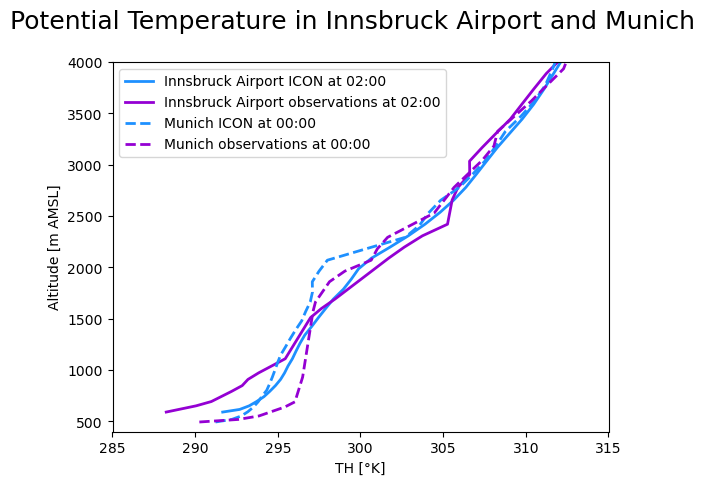

In [6]:
## COMPARE VALLEY AND PLAIN at 2 distinct times##
# general settings
pvar = vf.TH

pdate1 = dt.datetime(2019,9,14,2,00)
loc1= pc_dict['ifl']
pdate2 = dt.datetime(2019,9,14,0,00)
loc2= pc_dict['murs']

# plotsettings
xmin=285
xmax=315
ymin=400
ymax=4000
xdelticks=5

f, ax = plt.subplots(1,1)
f.suptitle(pvar.title+' in '+loc1.name + ' and ' +loc2.name  , fontsize=18, y=0.99)
# first time
lev_model_cut,sounding_model_cut1,sounding_rs_interp1,ti_model1,ti_rs1 = get_sounding(pvar,pdate1,loc1) 
m1 = ax.plot(sounding_model_cut1,  lev_model_cut, lw=2,color='dodgerblue',linestyle='solid',label=loc1.name+' ICON at '+pdate1.strftime('%H:%M'))
r1 = ax.plot(sounding_rs_interp1,  lev_model_cut, lw=2,color='darkviolet',linestyle='solid',label=loc1.name+' observations at '+pdate1.strftime('%H:%M'))
# second time
lev_model_cut,sounding_model_cut2,sounding_rs_interp2,ti_model2,ti_rs2 = get_sounding(pvar,pdate2,loc2) 
m2 = ax.plot(sounding_model_cut2,  lev_model_cut, lw=2,color='dodgerblue',linestyle='dashed',label=loc2.name+' ICON at '+pdate2.strftime('%H:%M'))
r2 = ax.plot(sounding_rs_interp2,  lev_model_cut, lw=2,color='darkviolet',linestyle='dashed',label=loc2.name+' observations at '+pdate2.strftime('%H:%M'))
                                                                                                                                                                          
# x

ax.set_xlim([xmin,xmax])
ax.set_xlabel(pvar.name+' '+pvar.units)
ax.set_xticks(np.arange(xmin,xmax+1,xdelticks))
# y
ax.set_ylim([ymin,ymax])
ax.set_ylabel('Altitude [m AMSL]')
ax.set_yticks(np.arange(ymin+100,ymax+1,500))
plt.legend()

plt.show()

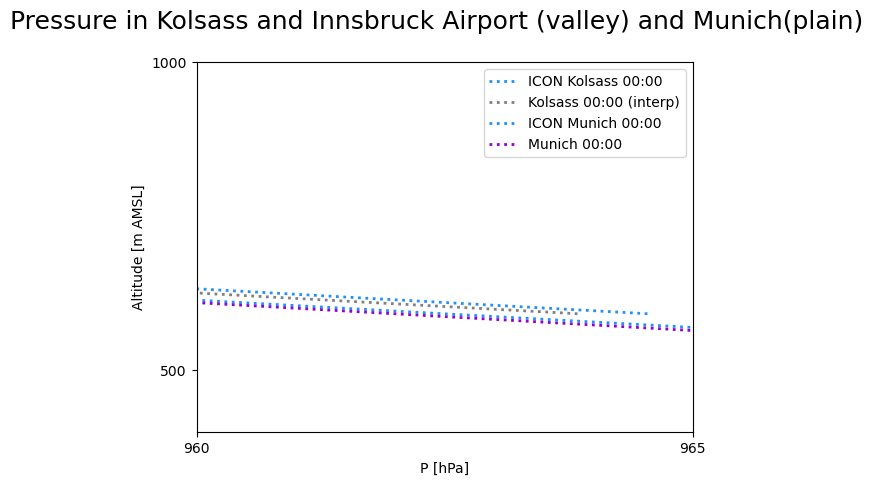

In [7]:
## TIME INTERPOLATION ##
pvar = vf.P

# interpolate Kolsass rs to 12 UTC to compare with Munich
pdate1 = dt.datetime(2019,9,13,23,00)
loc1= pc_dict['kols']
pdate2 = dt.datetime(2019,9,14,2,00)
loc2= pc_dict['ifl']
pdate3 = dt.datetime(2019,9,14,0,00)
loc3= pc_dict['murs']

# get rs and model data at 11 and 13 UTC in Kolsass
lev_model_cut,sounding_model_cut1,sounding_rs_interp1,ti_model1,ti_rs1 = get_sounding(pvar,pdate1,loc1)
# lev_model_cut,sounding_model_cut2,sounding_rs_interp2,ti_model2,ti_rs2 = get_sounding(pvar,pdate2,loc1)  
lev_model_cut,sounding_model_cut2,sounding_rs_interp2,ti_model2,ti_rs2 = get_sounding(pvar,pdate2,loc2)  
# interpolate
sounding_rs_interp3kols_i= (sounding_rs_interp1+sounding_rs_interp2)/2

# get rs and model data at 12 in Munich
lev_model_cut_murs,sounding_model_cut3murs,sounding_rs_interp3murs,ti_model3,ti_rs3 = get_sounding(pvar,pdate3,loc3) 
# get model data in Kolsass at 12 UTC
sounding_model = np.array(htd_data_model[loc1.short][pvar.name][ti_model3,:])
sounding_model_cut3kols = sounding_model[0:73]

## PLOT ##
# plotsettings 
xmin=960
xmax=965
ymin=400
ymax=1000

f, ax = plt.subplots(1,1)
f.suptitle(pvar.title+' in '+loc1.name + ' and ' +loc2.name + ' (valley) and '+loc3.name + '(plain)', fontsize=18, y=0.99)
# first time Kolsass
# m1 = ax.plot(sounding_model_cut1,  lev_model_cut, lw=2,color='dodgerblue',linestyle='solid',label='ICON'+pdate1.strftime('%H:%M'))
# r1 = ax.plot(sounding_rs_interp1,  lev_model_cut, lw=2,color='darkviolet',linestyle='solid',label='Kolsass '+pdate1.strftime('%H:%M'))
# # second time Kolsass
# m2 = ax.plot(sounding_model_cut2,  lev_model_cut, lw=2,color='dodgerblue',linestyle='dashed',label='ICON'+pdate2.strftime('%H:%M'))
# r2 = ax.plot(sounding_rs_interp2,  lev_model_cut, lw=2,color='darkviolet',linestyle='dashed',label='Kolsass '+pdate2.strftime('%H:%M'))
# interp time Kolsass
m3 = ax.plot(sounding_model_cut3kols,  lev_model_cut, lw=2,color='dodgerblue',linestyle='dotted',label='ICON Kolsass '+pdate3.strftime('%H:%M'))
r3 = ax.plot(sounding_rs_interp3kols_i,  lev_model_cut, lw=2,color='grey',linestyle='dotted',label='Kolsass '+pdate3.strftime('%H:%M')+' (interp)')
# interp time Munich
m3 = ax.plot(sounding_model_cut3murs,  lev_model_cut_murs, lw=2,color='dodgerblue',linestyle='dotted',label='ICON Munich '+pdate3.strftime('%H:%M'))
r3 = ax.plot(sounding_rs_interp3murs,  lev_model_cut_murs, lw=2,color='darkviolet',linestyle='dotted',label='Munich '+pdate3.strftime('%H:%M'))

# x
xdelticks=5
ax.set_xlim([xmin,xmax])
ax.set_xlabel(pvar.name+' '+pvar.units)
ax.set_xticks(np.arange(xmin,xmax+1,xdelticks))
# y
ax.set_ylim([ymin,ymax])
ax.set_ylabel('Altitude [m AMSL]')
ax.set_yticks(np.arange(ymin+100,ymax+101,500))
plt.legend()

plt.show()

In [8]:
sounding_model_cut3kols

array([964.54469492, 961.67042065, 957.75020374, 953.0868229 ,
       947.85261404, 942.12891437, 935.97168198, 929.42308084,
       922.51554276, 915.27455349, 907.72116698, 899.87297236,
       891.74551664, 883.35287878, 874.70713715, 865.81876353,
       856.69967989, 847.36226747, 837.81370084, 828.05946843,
       818.10558994, 807.95079115, 797.61184277, 787.10563023,
       776.42970341, 765.58759885, 754.5838799 , 743.42190357,
       732.10425731, 720.63292331, 709.00978045, 697.23711811,
       685.31786007, 673.25503194, 661.05174998, 648.71145779,
       636.23772191, 623.63474917, 610.90743702, 598.05964287,
       585.09375373, 572.01199013, 558.81502638, 545.5036756 ,
       532.08246216, 518.55817528, 504.93918589, 491.23467032,
       477.44600167, 463.57251944, 449.61893145, 435.59268154,
       421.50129588, 407.35044744, 393.14677357, 378.89915019,
       364.61265505, 350.28861689, 335.93123502, 321.54544552,
       307.14163514, 292.74188392, 278.37217765, 264.04

In [9]:
sounding_model_cut3murs

array([973.46709585, 970.6066533 , 966.73592053, 962.12535158,
       956.9580816 , 951.31263143, 945.2412749 , 938.78275547,
       931.96590868, 924.81273871, 917.34202021, 909.56940744,
       901.50838613, 893.17157758, 884.57003213, 875.71284249,
       866.60769507, 857.26028302, 847.6758685 , 837.8578596 ,
       827.80719172, 817.5324206 , 807.0451027 , 796.38216639,
       785.57945867, 774.61936323, 763.47755105, 752.15312769,
       740.65704526, 728.99453398, 717.16576573, 705.17512113,
       693.02390588, 680.71627366, 668.25923322, 655.65381423,
       642.89594902, 629.98459736, 616.92298737, 603.71600248,
       590.37273044, 576.90639866, 563.3332184 , 549.66458273,
       535.90247571, 522.05226491, 508.12123154, 494.11281511,
       480.03206814, 465.8815042 , 451.66223862, 437.37908579,
       423.03805087, 408.6507232 , 394.2330822 , 379.7910762 ,
       365.32227675, 350.82535921, 336.30391419, 321.76814951,
       307.23217613, 292.7120066 , 278.22620554, 263.79

In [10]:
lev_model_cut_kols,sounding_model_cut2,sounding_rs_interp2,ti_model2,ti_rs2 = get_sounding(pvar,pdate2,loc2) 

In [11]:
pvar = vf.P
# NIGHT 2
pdate1 = dt.datetime(2019,9,13,23,00)
loc1=pc_dict['kols']
pdate2 = dt.datetime(2019,9,14,2,00)
loc2=pc_dict['ifl']
pdate3 = dt.datetime(2019,9,14,0,00)
loc3=pc_dict['murs']

lev_model_cut_kols,sounding_model_cut1,sounding_rs_interp1,ti_model1,ti_rs1 = get_sounding(pvar,pdate1,loc1)
lev_model_cut_ifl,sounding_model_cut2,sounding_rs_interp2,ti_model2,ti_rs2 = get_sounding(pvar,pdate2,loc2) 
 
sounding_rs_interp2_i = interp1d(sounding_rs_interp2, lev_model_cut_ifl, lev_model_cut_kols)[1:]

In [12]:
len(lev_model_cut_ifl)

73

In [13]:
sounding_rs_interp2_i.mean()

<xarray.DataArray 'field_z' ()>
array(602.75893562)

In [14]:
sounding_model

array([964.54469492, 961.67042065, 957.75020374, 953.0868229 ,
       947.85261404, 942.12891437, 935.97168198, 929.42308084,
       922.51554276, 915.27455349, 907.72116698, 899.87297236,
       891.74551664, 883.35287878, 874.70713715, 865.81876353,
       856.69967989, 847.36226747, 837.81370084, 828.05946843,
       818.10558994, 807.95079115, 797.61184277, 787.10563023,
       776.42970341, 765.58759885, 754.5838799 , 743.42190357,
       732.10425731, 720.63292331, 709.00978045, 697.23711811,
       685.31786007, 673.25503194, 661.05174998, 648.71145779,
       636.23772191, 623.63474917, 610.90743702, 598.05964287,
       585.09375373, 572.01199013, 558.81502638, 545.5036756 ,
       532.08246216, 518.55817528, 504.93918589, 491.23467032,
       477.44600167, 463.57251944, 449.61893145, 435.59268154,
       421.50129588, 407.35044744, 393.14677357, 378.89915019,
       364.61265505, 350.28861689, 335.93123502, 321.54544552,
       307.14163514, 292.74188392, 278.37217765, 264.04

In [48]:
## CALC GRADIENTS AND PLOT ##
def calc_and_plot_gradient(pvar,pdate1,pdate2,pdate3,loc1,loc2,loc3,plottype,ax):
    # times
    delt_rs = pdate2 - pdate1
    delt_interp = pdate3 - pdate1
    
    # get rs and model data at 11 and 13 UTC in Kolsass
    lev_model_cut_kols,sounding_model_cut1,sounding_rs_interp1,ti_model1,ti_rs1 = get_sounding(pvar,pdate1,loc1)
    lev_model_cut_2,sounding_model_cut2,sounding_rs_interp2,ti_model2,ti_rs2 = get_sounding(pvar,pdate2,loc2) 

    # further steps for second night where ifl sounding is used
    if loc2.short == 'ifl': # 
        # rs_heights_kols = htd_data_kolsrs_interp['ALT'][ti_rs1]                                                  # get rs altitudes in Kolsass    
        # rs_heights_ifl = htd_data_iflrs_interp['ALT'][ti_rs2]                                                  # get rs altitudes in Ifl  
        # lev_model_cut_ifl,a,b,c,d = get_sounding(pvar,pdate2,loc2) 
        sounding_rs_interp2 = interp1d(sounding_rs_interp2, lev_model_cut_2, np.transpose(lev_model_cut_kols)) # to interpolate rs on kolsass model levels for time interp
        # Exclude bullshit downwards interpolation = lowest kols level!
        lmck_low_bound = 1            
        sounding_rs_interp1 = sounding_rs_interp1[lmck_low_bound:]  
        sounding_rs_interp2 = sounding_rs_interp2[lmck_low_bound:]
        lev_model_cut_kols = lev_model_cut_kols[lmck_low_bound:]
    else :
        lmck_low_bound = 0

    # cut lower bound for
    # INTERPOLATE OBSERVATIONS OVER TIME
    sounding_rs_interp3kols_i= sounding_rs_interp1+(sounding_rs_interp2-sounding_rs_interp1)/(delt_rs.seconds/3600)*(delt_interp.seconds/3600)

    # get rs and model data at 12 pdate3
    lev_model_cut_murs,sounding_model_cut3murs,sounding_rs_interp3murs,ti_model3,ti_rs3 = get_sounding(pvar,pdate3,loc3) 
    
    # get model data in Kolsass at pdate3
    sounding_model = np.array(htd_data_model[loc1.short][pvar.name][ti_model3,:])
    sounding_model_cut3kols = sounding_model[lmck_low_bound:73]

    ## PLOT SINGLE RS ##
    if plottype == 'rs': # plot radiosounding times singularly
        if pvar.name == 'TH':
            xmin=285
            xmax=315
        elif pvar.name == 'P':
            xmin=200
            xmax=900
        ymin=400
        ymax=4000
        ax.set_title(pvar.name+' at '+pdate3.strftime('%H:%M'), fontsize=10, y=0.89,)
        # # first time Kolsass
        # m1 = ax.plot(sounding_model_cut1,  lev_model_cut_kols, lw=2,color='dodgerblue',linestyle='solid',label='ICON'+pdate1.strftime('%H:%M'))
        # r1 = ax.plot(sounding_rs_interp1,  lev_model_cut_kols, lw=2,color='darkviolet',linestyle='solid',label='Kolsass '+pdate1.strftime('%H:%M'))
        # second time Kolsass
        # m2 = ax.plot(sounding_model_cut2,  lev_model_cut_kols, lw=2,color='dodgerblue',linestyle='dashed',label='ICON'+pdate2.strftime('%H:%M'))
        # r2 = ax.plot(sounding_rs_interp2,  lev_model_cut_kols, lw=2,color='darkviolet',linestyle='dashed',label='Kolsass '+pdate2.strftime('%H:%M'))
        # interp time Kolsass
        # interp time Kolsass
        m3 = ax.plot(sounding_model_cut3kols,  lev_model_cut_kols, lw=2,color='dodgerblue',linestyle='solid',label='ICON Kolsass '+pdate3.strftime('%H:%M'))
        r3 = ax.plot(sounding_rs_interp3kols_i,  lev_model_cut_kols, lw=2,color='darkviolet',linestyle='solid',label='observation Kolsass  '+pdate3.strftime('%H:%M')+' (interp)')
        # interp time Munich
        m3 = ax.plot(sounding_model_cut3murs,  lev_model_cut_murs, lw=2,color='dodgerblue',linestyle='dotted',label='ICON Munich'+pdate3.strftime('%H:%M'))
        r3 = ax.plot(sounding_rs_interp3murs,  lev_model_cut_murs, lw=2,color='darkviolet',linestyle='dotted',label='observation Munich '+pdate3.strftime('%H:%M'))

        # fill between to highlight bias
        ax.fill_betweenx(lev_model_cut_kols, sounding_model_cut3kols, sounding_rs_interp3kols_i, where=(sounding_model_cut3kols > sounding_rs_interp3kols_i), alpha=0.2, color='orangered')
        ax.fill_betweenx(lev_model_cut_kols, sounding_model_cut3kols, sounding_rs_interp3kols_i, where=(sounding_rs_interp3kols_i > sounding_model_cut3kols), alpha=0.2, color='cyan')

        ax.fill_betweenx(lev_model_cut_murs, sounding_model_cut3murs, sounding_rs_interp3murs, where=(sounding_model_cut3murs < sounding_rs_interp3murs), alpha=0.2, color='cyan')
        ax.fill_betweenx(lev_model_cut_murs, sounding_model_cut3murs, sounding_rs_interp3murs, where=(sounding_rs_interp3murs < sounding_model_cut3murs), alpha=0.2, color='orangered')

        # x
        xdelticks=5
        ax.set_xlim([xmin,xmax])
        ax.set_xlabel(pvar.name+' '+pvar.units)
        ax.set_xticks(np.arange(xmin,xmax+1,xdelticks))
        # y
        ax.set_ylim([ymin,ymax])
        ax.set_ylabel('Altitude [m AMSL]')
        ax.set_yticks(np.arange(ymin+100,ymax+101,500))
        plt.legend(loc='best')

        plt.show()    

    ## gradients ##
    # delX = Xvalley - Xplain

    # approach 1: between altitudes AMSL
    # for this we need to interpolate kols data (rs+model) to murs levels
    sounding_rs_interp3kols_i_lm  = interp1d(sounding_rs_interp3kols_i, lev_model_cut_kols, np.transpose(lev_model_cut_murs)) # lm= levels murs
    sounding_model_cut3kols_lm  = interp1d(sounding_model_cut3kols, lev_model_cut_kols, np.transpose(lev_model_cut_murs)) # lm= levels murs
    # we exclude firs three datapoints, as they are unphysical (interpolation of rs to sub-topo altitudes)
    lmck_low_bound = lmck_low_bound +3
    lev_model_cut_murs_cut = lev_model_cut_murs[lmck_low_bound:73]
    
    # compute gradients
    del_model_amsl = np.array(sounding_model_cut3kols_lm[lmck_low_bound:73] - sounding_model_cut3murs[lmck_low_bound:73])
    del_rs_amsl = np.array(sounding_rs_interp3kols_i_lm[lmck_low_bound:73] - sounding_rs_interp3murs[lmck_low_bound:73])

    # approach 2: between altitudes AGL: treat values as they where on same levels
    # compute gradients
    # del_model_agl = sounding_model_cut3kols - sounding_model_cut3murs
    # del_rs_agl = sounding_rs_interp3kols_i - sounding_rs_interp3murs

    # decide which to use: look at model bias
    bias_amsl = del_model_amsl - del_rs_amsl
    # bias_agl = del_model_agl - del_rs_agl

    ## PLOT ##
    if plottype == 'grad':
        if pvar.name == 'TH':
            xmin=-6
            xmax=6.1
            xdelticks=2
        elif pvar.name == 'P':
            xmin=-2
            xmax=2.1
            xdelticks=1
        ymin=400
        ymax=4000

        # ax.set_title(pvar.name+' gradient at '+pdate3.strftime('%H UTC %d.%m.%Y'), fontsize=18, y=0.89)
        # ax.text(0.35, 0.85, pvar.name+' gradient', transform=ax.transAxes, size=18)
        ax.vlines(0,ymin,ymax,colors='k', linestyles='solid')
        # approach 1 AMSL
        m3 = ax.plot(del_model_amsl,  lev_model_cut_murs_cut, lw=2,color='dodgerblue',linestyle='solid',label='ICON gradient AMSL')
        r3 = ax.plot(del_rs_amsl,  lev_model_cut_murs_cut, lw=2,color='darkviolet',linestyle='solid',label='observation gradient AMSL')
        # bias = ax.plot(bias_amsl,  lev_model_cut_murs_cut, lw=2,color='red',linestyle='solid',label='bias AMSL')
        # approach 1 AGL
        # m3 = ax.plot(del_model_agl,  lev_model_cut_murs, lw=2,color='dodgerblue',linestyle='dotted',label='ICON gradient AGL')
        # r3 = ax.plot(del_rs_agl,  lev_model_cut_murs, lw=2,color='darkviolet',linestyle='dotted',label='observation gradient AGL')
        # bias = ax.plot(bias_agl,  lev_model_cut_murs, lw=2,color='red',linestyle='dotted',label='bias AGL')
        
        # mark bias as under- overestimation of variable +/-
        # ax.fill_betweenx(lev_model_cut_murs_cut, del_model_amsl, del_rs_amsl, where=(del_model_amsl < del_rs_amsl), alpha=0.2, color='cyan')
        # ax.fill_betweenx(lev_model_cut_murs_cut, del_model_amsl, del_rs_amsl, where=(del_rs_amsl < del_model_amsl), alpha=0.2, color='orangered')

        # mark bias as under- overestimation of gradient, independent of direction
        # ax.fill_betweenx(lev_model_cut_murs_cut, del_model_amsl, del_rs_amsl, where=(np.abs(del_model_amsl) < np.abs(del_rs_amsl)), alpha=0.2, color='cyan')
        # ax.fill_betweenx(lev_model_cut_murs_cut, del_model_amsl, del_rs_amsl, where=(np.abs(del_rs_amsl) < np.abs(del_model_amsl)), alpha=0.2, color='orangered')

        # x
        # ax.set_xlim([xmin,xmax])
        ax.set_xlabel(pvar.name+' '+pvar.units)
        ax.set_xticks(np.arange(xmin,xmax,xdelticks))
        # y
        ax.set_ylim([ymin,ymax])
        ax.set_ylabel('Altitude [m AMSL]')
        ax.set_yticks(np.arange(ymin+100,ymax+101,500))

        return ax               

In [16]:
print('\u03B8')

θ


/tmp/ipykernel_134465/1680000136.py:12: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc.short][pvar.name][ti_model,:])
/tmp/ipykernel_134465/313185678.py:33: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc1.short][pvar.name][ti_model3,:])


NameError: name 'cf1' is not defined

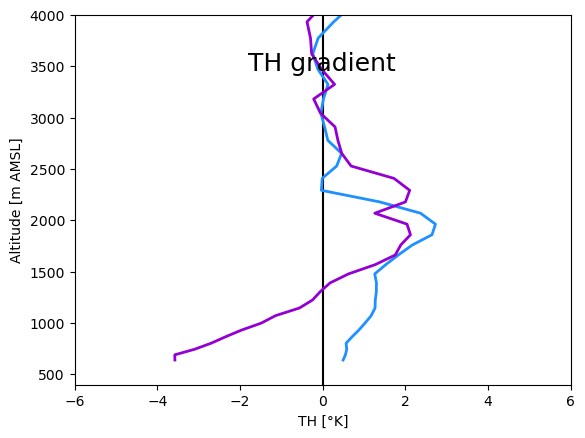

In [17]:
## plot 1 gradient at 1 time ##
pvar = vf.TH
# NIGHT 1
pdate1 = dt.datetime(2019,9,12,23,00)
loc1=pc_dict['kols']
pdate2 = dt.datetime(2019,9,13,3,00)
loc2=pc_dict['kols']
pdate3 = dt.datetime(2019,9,13,0,00)
loc3=pc_dict['murs']

# DAY
pdate1 = dt.datetime(2019,9,13,11,00)
loc1=pc_dict['kols']
pdate2 = dt.datetime(2019,9,13,13,00)
loc2=pc_dict['kols']
pdate3 = dt.datetime(2019,9,13,12,00)
loc3=pc_dict['murs']

# NIGHT 2
pdate1 = dt.datetime(2019,9,13,23,00)
loc1=pc_dict['kols']
pdate2 = dt.datetime(2019,9,14,2,00)
loc2=pc_dict['ifl']
pdate3 = dt.datetime(2019,9,14,0,00)
loc3=pc_dict['murs']

fig,ax = plt.subplots(1,1)
ax = calc_and_plot_gradient(pvar,pdate1,pdate2,pdate3,loc1,loc2,loc3,plottype='grad',ax=ax)
cbar = plt.colorbar(cf1,orientation='horizontal',ax=ax)
cbar.set_ticks([])
cbar.set_label(pvar.name+' '+pvar.units,fontsize=10)
# cbar.outline.set_linewidth(1)

# ax.legend(loc='lower right')

/tmp/ipykernel_134465/1680000136.py:12: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc.short][pvar.name][ti_model,:])
/tmp/ipykernel_134465/1525915329.py:33: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc1.short][pvar.name][ti_model3,:])
/tmp/ipykernel_134465/1680000136.py:12: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc.short][pvar.name][ti_model,:])
/tmp/ipykernel_134465/1525915329.py:33: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc1.short][pvar.name][ti_model3,:])
/tmp/ipykernel_134465/1680000136.py:12: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  sounding_model = np.array(htd_data_model[loc.sh

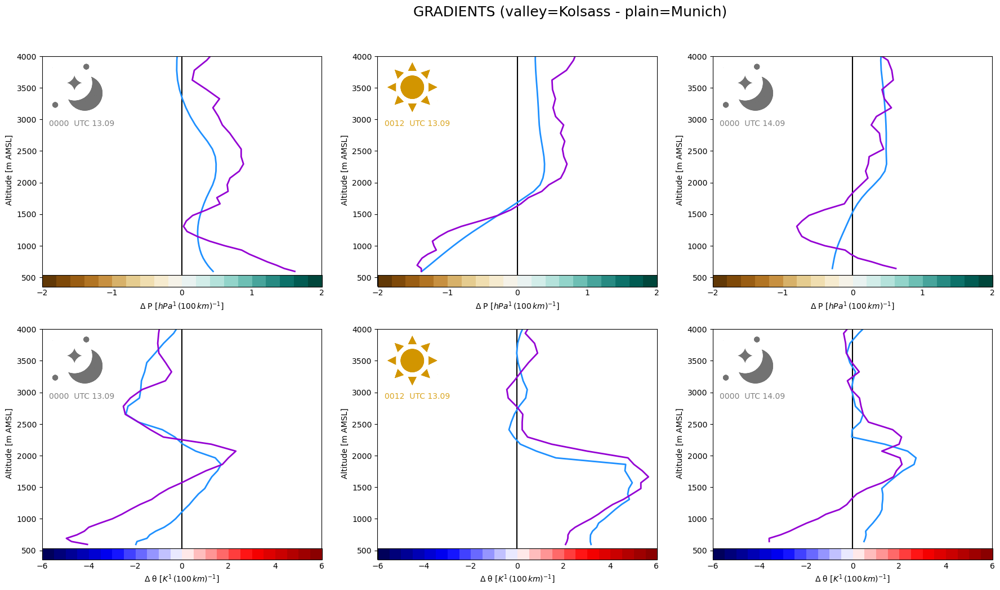

In [59]:
######################## ALL 4 GRADIENT PLOTS IN 1 PLOT ###################################################

f, ax = plt.subplots(2,3,figsize=(25,10))
f.suptitle('GRADIENTS (valley=Kolsass - plain=Munich)', fontsize=18, y=0.99)
plt.subplots_adjust(bottom=0.01, right=0.8, top=0.9,hspace=0.2)

# NIGHT 1 
pdate1 = dt.datetime(2019,9,12,23,00)
loc1=pc_dict['kols']
pdate2 = dt.datetime(2019,9,13,3,00)
loc2=pc_dict['kols']
pdate3 = dt.datetime(2019,9,13,0,00)
loc3=pc_dict['murs']
ax[0,0] = calc_and_plot_gradient(pvar=vf.P,pdate1=pdate1,pdate2=pdate2,pdate3=pdate3,loc1=loc1,loc2=loc2,loc3=loc3,plottype='grad',ax=ax[0,0])
ax[1,0] = calc_and_plot_gradient(pvar=vf.TH,pdate1=pdate1,pdate2=pdate2,pdate3=pdate3,loc1=loc1,loc2=loc2,loc3=loc3,plottype='grad',ax=ax[1,0])
ax[0,0].text(-1.9, 2900, pdate3.strftime('%M%H  UTC %d.%m'), size=10,color='grey')
ax[1,0].text(-5.7, 2900, pdate3.strftime('%M%H  UTC %d.%m'), size=10,color='grey')

# DAY 
pdate1 = dt.datetime(2019,9,13,11,00)
loc1=pc_dict['kols']
pdate2 = dt.datetime(2019,9,13,13,00)
loc2=pc_dict['kols']
pdate3 = dt.datetime(2019,9,13,12,00)
loc3=pc_dict['murs']
ax[0,1] = calc_and_plot_gradient(pvar=vf.P,pdate1=pdate1,pdate2=pdate2,pdate3=pdate3,loc1=loc1,loc2=loc2,loc3=loc3,plottype='grad',ax=ax[0,1])
ax[1,1] = calc_and_plot_gradient(pvar=vf.TH,pdate1=pdate1,pdate2=pdate2,pdate3=pdate3,loc1=loc1,loc2=loc2,loc3=loc3,plottype='grad',ax=ax[1,1])
ax[0,1].text(-1.9, 2900, pdate3.strftime('%M%H  UTC %d.%m'), size=10,color='goldenrod')
ax[1,1].text(-5.7, 2900, pdate3.strftime('%M%H  UTC %d.%m'), size=10,color='goldenrod')

# NIGHT 2 
pdate1 = dt.datetime(2019,9,13,23,00)
loc1=pc_dict['kols']
pdate2 = dt.datetime(2019,9,14,2,00)
loc2=pc_dict['ifl']
pdate3 = dt.datetime(2019,9,14,0,00)
loc3=pc_dict['murs']
ax[0,2] = calc_and_plot_gradient(pvar=vf.P,pdate1=pdate1,pdate2=pdate2,pdate3=pdate3,loc1=loc1,loc2=loc2,loc3=loc3,plottype='grad',ax=ax[0,2])
ax[1,2] = calc_and_plot_gradient(pvar=vf.TH,pdate1=pdate1,pdate2=pdate2,pdate3=pdate3,loc1=loc1,loc2=loc2,loc3=loc3,plottype='grad',ax=ax[1,2])
ax[0,2].text(-1.9, 2900, pdate3.strftime('%M%H  UTC %d.%m'), size=10,color='grey')
ax[1,2].text(-5.7, 2900, pdate3.strftime('%M%H  UTC %d.%m'), size=10,color='grey')

# add cbar for central plots
# p_grad
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
cbar_ax_0 = inset_axes(ax[0,1],
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower right',
                   bbox_to_anchor=(0.015, -0.03, 1, 1),
                   bbox_transform=ax[0,1].transAxes,
                #    borderpad=0,
                   )
cbar = fig.colorbar(cf2, cax=cbar_ax_0, orientation='horizontal')
cbar.set_ticks([])
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
cbar_ax_0 = inset_axes(ax[0,0],
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower right',
                   bbox_to_anchor=(0.015, -0.03, 1, 1),
                   bbox_transform=ax[0,0].transAxes,
                #    borderpad=0,
                   )
cbar = fig.colorbar(cf2, cax=cbar_ax_0, orientation='horizontal')
cbar.set_ticks([])
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
cbar_ax_0 = inset_axes(ax[0,2],
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower right',
                   bbox_to_anchor=(0.015, -0.03, 1, 1),
                   bbox_transform=ax[0,2].transAxes,
                #    borderpad=0,
                   )
cbar = fig.colorbar(cf2, cax=cbar_ax_0, orientation='horizontal')
cbar.set_ticks([])

# TH_grad
cbar_ax_1 = inset_axes(ax[1,1],
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower right',
                   bbox_to_anchor=(0.015, -0.03, 1, 1),
                   bbox_transform=ax[1,1].transAxes,
                #    borderpad=0,
                   )
cbar = fig.colorbar(cf1, cax=cbar_ax_1, orientation='horizontal')
cbar.set_ticks([])

cbar_ax_1 = inset_axes(ax[1,0],
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower right',
                   bbox_to_anchor=(0.015, -0.03, 1, 1),
                   bbox_transform=ax[1,0].transAxes,
                #    borderpad=0,
                   )
cbar = fig.colorbar(cf1, cax=cbar_ax_1, orientation='horizontal')
cbar.set_ticks([])

cbar_ax_1 = inset_axes(ax[1,2],
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower right',
                   bbox_to_anchor=(0.015, -0.03, 1, 1),
                   bbox_transform=ax[1,2].transAxes,
                #    borderpad=0,
                   )
cbar = fig.colorbar(cf1, cax=cbar_ax_1, orientation='horizontal')
cbar.set_ticks([])

# add nice axes descriptions
ax[0,0].set_xlabel('\u0394 P '+ vf.P_grad.units)
ax[0,1].set_xlabel('\u0394 P '+ vf.P_grad.units)
ax[0,2].set_xlabel('\u0394 P '+ vf.P_grad.units)
ax[1,0].set_xlabel('\u0394 \u03B8 ' + vf.TH_grad.units)
ax[1,1].set_xlabel('\u0394 \u03B8 ' + vf.TH_grad.units)
ax[1,2].set_xlabel('\u0394 \u03B8 ' + vf.TH_grad.units)

# add day night symbols
import matplotlib.image as image
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
import matplotlib.patches as patches

file_day = '../data/DAY.png'
image_day = image.imread(file_day)
imagebox = OffsetImage(image_day, zoom = 0.15)
insert_day = AnnotationBbox(imagebox, (-1.5, 3500), frameon = False, zorder=1000)
ax[0,1].add_artist(insert_day)
insert_day = AnnotationBbox(imagebox, (-4.5, 3500), frameon = False, zorder=1000)
ax[1,1].add_artist(insert_day)

file_night = '../data/NIGHT.png'
image_night = image.imread(file_night)
imagebox = OffsetImage(image_night, zoom = 0.15)
insert_night = AnnotationBbox(imagebox, (-1.5, 3500), frameon = False, zorder=1000)
ax[0,0].add_artist(insert_night)
insert_night = AnnotationBbox(imagebox, (-1.5, 3500), frameon = False, zorder=1000)
ax[0,2].add_artist(insert_night)
insert_night = AnnotationBbox(imagebox, (-4.5, 3500), frameon = False, zorder=1000)
ax[1,0].add_artist(insert_night)
insert_night = AnnotationBbox(imagebox, (-4.5, 3500), frameon = False, zorder=1000)
ax[1,2].add_artist(insert_night)

In [18]:
## COMPARE VALLEY AND PLAIN 3: model gradients for whole model time series ##
## DECIDE TWO POINTS ##
loc_v = pc_dict['kols'] # kols, egg, terf, ifl
loc_p = pc_dict['murs'] # 
for pvar in pvars_list:
    # make space in dataset
    htd_data_model[loc_v.short][pvar.name+'_grad']= np.zeros((len(plotdates_model),70)) 
for counter,pdate in enumerate(plotdates_model):
    for pvar in pvars_list:
        # interpolate kols model data to murs levels
        kols_data_lm = interp1d(htd_data_model[loc_v.short][pvar.name][counter], htd_data_model[loc_v.short]['HFL_loc'], np.transpose(htd_data_model[loc_p.short]['HFL_loc'])) # lm= levels murs
        # get murs data to subtract
        murs_data_lm = np.array(htd_data_model[loc_p.short][pvar.name][counter])
        htd_data_model[loc_v.short][pvar.name+'_grad'][counter] =  kols_data_lm[3:73] - murs_data_lm[3:73] # exclude lowest 3 datapoints


/scratch/tlezuo/miniconda3/envs/psyplot/lib/python3.9/site-packages/wrf/extension.py:156: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  result = dinterp1d(v_in,
/tmp/ipykernel_134465/3749844309.py:13: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  murs_data_lm = np.array(htd_data_model[loc_p.short][pvar.name][counter])


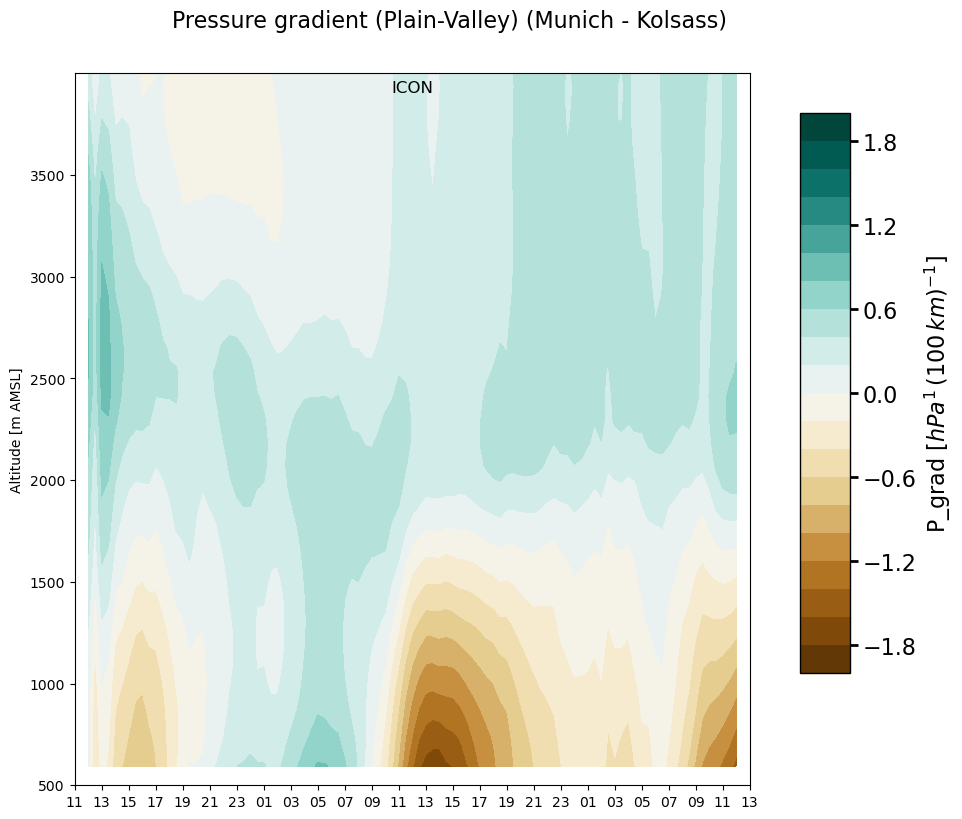

In [19]:
## simple plot of either Th or P gradient ##
# variable
pvar = vf.P_grad
levels = np.arange(pvar.min,pvar.max+0.1,pvar.ticks)

# vertical range
zmin = 500
zmax = 4000
altitudes = np.arange(zmin,zmax,500)

# time range
startdate_plot = dt.datetime(2019,9,12,11,00)
enddate_plot = dt.datetime(2019,9,14,13,00)
plotfreq_plot = '2h0min'
plotdates_plot = pd.date_range(startdate_plot,enddate_plot,freq=plotfreq_plot)

# figure settings
fig, ax1 = plt.subplots(1,1, figsize=(10,8))
plt.subplots_adjust(bottom=0.01, right=0.8, top=0.9,hspace=0.1)
fig.suptitle(pvar.title+' ('+loc_p.name+' - '+loc_v.name+')', fontsize=16)

# plot
x1 = plotdates_model
y1 = htd_data_model['murs']['HFL_loc'][3:73]
z1 = np.transpose(htd_data_model[loc_v.short][pvar.name])
cf = ax1.contourf(x1,y1,z1, levels = levels, cmap=pvar.cmap)

# plotting options
ax1.set_ylim(zmin,zmax)
ax1.set_xlim(startdate_plot,enddate_plot)
# ax1.grid()
ax1.set_title('ICON', y=1.0, pad=-14)
# ax1.set_xlabel('Time [h]')
ax1.set_xticks(plotdates_plot)
ax1.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
ax1.set_ylabel('Altitude [m AMSL]')
ax1.set_yticks(altitudes)

# add colorbar 
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
cbar = fig.colorbar(cf, cax=cbar_ax)
# cbar = plt.colorbar(cf,orientation='vertical')
cbar.ax.tick_params(labelsize=16,width=2,length=6)
cbar.set_label(pvar.name+' '+pvar.units,fontsize=16)
cbar.outline.set_linewidth(1)

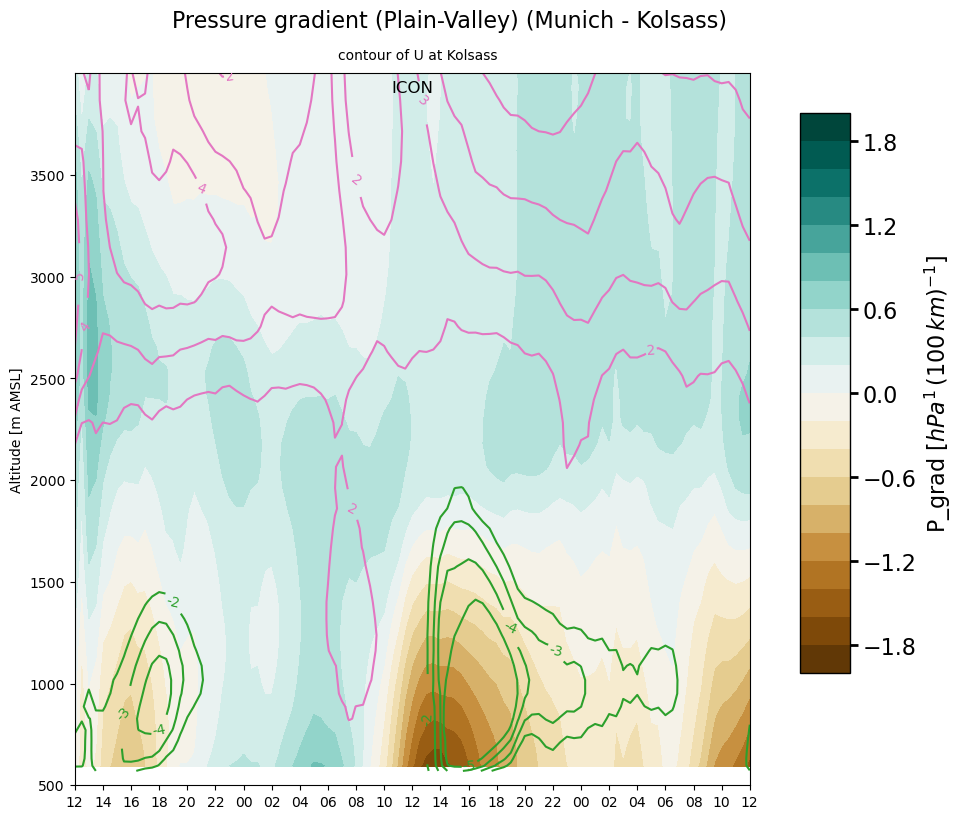

In [20]:
## simple plot of either Th or P gradient ##
# variable
pvar = vf.P_grad
levels = np.arange(pvar.min,pvar.max+0.1,pvar.ticks)

pvar_c = vf.U
# levels_c =  [2,4,6,8,10,12,16]
levels_c =  [-5,-4,-3,-2,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
# loc_vw = pc_dict['kols']
loc_vw = loc_v

# vertical range
zmin = 500
zmax = 4000
altitudes = np.arange(zmin,zmax,500)

# time range
startdate_plot = dt.datetime(2019,9,12,12,00)
enddate_plot = dt.datetime(2019,9,14,12,00)
plotfreq_plot = '2h0min'
plotdates_plot = pd.date_range(startdate_plot,enddate_plot,freq=plotfreq_plot)

# figure settings
fig, ax1 = plt.subplots(1,1, figsize=(10,8))
plt.subplots_adjust(bottom=0.01, right=0.8, top=0.9,hspace=0.1)
fig.suptitle(pvar.title+' ('+loc_p.name+' - '+loc_v.name+')', fontsize=16)
ax1.annotate('contour of '+pvar_c.name+' at '+loc_vw.name, xy=(0.42,1.17),xytext=(0.39,1.02),xycoords=('axes fraction','axes fraction'),color='k')

# colormap
x1 = plotdates_model
y1 = htd_data_model['murs']['HFL_loc'][3:73]
z1 = np.transpose(htd_data_model[loc_v.short][pvar.name])#[3:73]
cf = ax1.contourf(x1,y1,z1, levels = levels, cmap=pvar.cmap)

# contourlines
y1c = htd_data_model[loc_vw.short]['HFL_loc']
z1c = np.transpose(htd_data_model[loc_vw.short][pvar_c.name])
ct = ax1.contour(x1,y1c,z1c,levels = levels_c, colors=['tab:green','tab:green','tab:green','tab:green','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink'])
ct.clabel(fmt='%1.f', inline_spacing=1)

# plotting options
ax1.set_ylim(zmin,zmax)
ax1.set_xlim(startdate_plot,enddate_plot)
# ax1.grid()
ax1.set_title('ICON', y=1.0, pad=-14)
# ax1.set_xlabel('Time [h]')
ax1.set_xticks(plotdates_plot)
ax1.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
ax1.set_ylabel('Altitude [m AMSL]')
ax1.set_yticks(altitudes)

# add colorbar 
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
cbar = fig.colorbar(cf, cax=cbar_ax)
# cbar = plt.colorbar(cf,orientation='vertical')
cbar.ax.tick_params(labelsize=16,width=2,length=6)
cbar.set_label(pvar.name+' '+pvar.units,fontsize=16)
cbar.outline.set_linewidth(1)

# save
plotpath_base = '/users/tlezuo/icon-vis/height_time_diagrams/plots/'
plotpath = plotpath_base+str(pvar.name)+'/'
Path(plotpath).mkdir(parents=True, exist_ok=True)
plotname = pvar.name + loc_p.short + '_MINUS_' + loc_v.short + '_VELat_'+loc_vw.short
plt.savefig(plotpath+plotname)

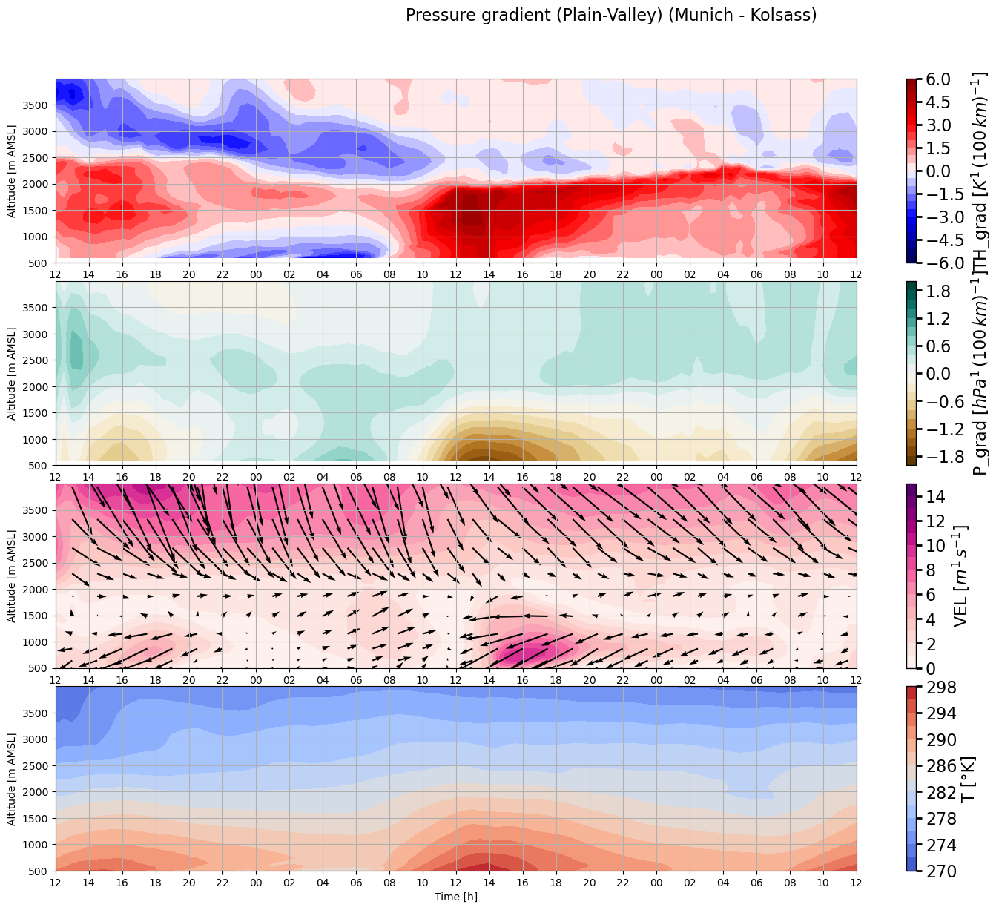

In [21]:
## 3 subpolts of mechanisms: TH, P, VEL ##
# variable
pvar1 = vf.TH_grad
levels1 = np.arange(pvar1.min,pvar1.max+0.1,pvar1.ticks)

pvar2 = vf.P_grad
levels2 = np.arange(pvar2.min,pvar2.max+0.1,pvar2.ticks)

pvar3 = vf.VEL
levels3 = np.arange(pvar3.min,pvar3.max+0.1,pvar3.ticks)

pvar4 = vf.T
levels4 = np.arange(270,300,2)

# vertical range
zmin = 500
zmax = 4000
altitudes = np.arange(zmin,zmax,500)

# time range
startdate_plot = dt.datetime(2019,9,12,12,00)
enddate_plot = dt.datetime(2019,9,14,12,00)
plotfreq_plot = '2h0min'
plotdates_plot = pd.date_range(startdate_plot,enddate_plot,freq=plotfreq_plot)

# figure settings
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1, figsize=(20,12))
plt.subplots_adjust(bottom=0.01, right=0.8, top=0.9,hspace=0.1)
fig.suptitle(pvar.title+' ('+loc_p.name+' - '+loc_v.name+')', fontsize=16)

#########################################################################
# ax 1 TH_grad
x1 = plotdates_model
y1 = htd_data_model['murs']['HFL_loc'][3:73]
z1 = np.transpose(htd_data_model[loc_v.short][pvar1.name])#[3:73]
cf1 = ax1.contourf(x1,y1,z1, levels = levels1, cmap=pvar1.cmap)

# plotting options
ax1.set_ylim(zmin,zmax)
ax1.set_xlim(startdate_plot,enddate_plot)
ax1.grid()
# ax1.set_title('ICON', y=1.0, pad=-14)
# ax1.set_xlabel('Time [h]')
ax1.set_xticks(plotdates_plot)
ax1.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
ax1.set_ylabel('Altitude [m AMSL]')
ax1.set_yticks(altitudes)

# add colorbar 

cbar1 = plt.colorbar(cf1,orientation='vertical',ax=ax1)
cbar1.ax.tick_params(labelsize=16,width=2,length=6)
cbar1.set_label(pvar1.name+' '+pvar1.units,fontsize=16)
cbar1.outline.set_linewidth(1)

#########################################################################
# ax 2 P_grad
x1 = plotdates_model
y1 = htd_data_model['murs']['HFL_loc'][3:73]
z1 = np.transpose(htd_data_model[loc_v.short][pvar2.name])#[3:73]
cf2 = ax2.contourf(x1,y1,z1, levels = levels2, cmap=pvar2.cmap)

# plotting options
ax2.set_ylim(zmin,zmax)
ax2.set_xlim(startdate_plot,enddate_plot)
ax2.grid()
# ax2.set_title('ICON', y=1.0, pad=-14)
# ax2.set_xlabel('Time [h]')
ax2.set_xticks(plotdates_plot)
ax2.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
ax2.set_ylabel('Altitude [m AMSL]')
ax2.set_yticks(altitudes)

# add colorbar 
cbar2 = plt.colorbar(cf2,orientation='vertical',ax=ax2)
cbar2.ax.tick_params(labelsize=16,width=2,length=6)
cbar2.set_label(pvar2.name+' '+pvar2.units,fontsize=16)
cbar2.outline.set_linewidth(1)

#########################################################################
# ax 3 VEL
x1 = plotdates_model
y1 = htd_data_model['murs']['HFL_loc']
z1 = np.transpose(htd_data_model[loc_v.short][pvar3.name])
cf3 = ax3.contourf(x1,y1,z1, levels = levels3, cmap=pvar3.cmap)

u1 = np.transpose(htd_data_model[loc_v.short]['U'])
v1 = np.transpose(htd_data_model[loc_v.short]['V'])

#create plot
# colormap
# cf = ax3.contourf(x1,y1,z1, levels = levels, cmap=pvar.cmap)
# windbarbs
# windbarb settings
q_scale = 10
q_width = 0.002
dx1 = 3
dy1 = 4
ax3.quiver(x1[2::dx1], y1[::dy1], u1[::dy1, 2::dx1], v1[::dy1, 2::dx1], 
        scale=q_scale, scale_units='inches', width=q_width)  

# plotting options
ax3.set_ylim(zmin,zmax)
ax3.set_xlim(startdate_plot,enddate_plot)
ax3.grid()
# ax3.set_title('ICON', y=1.0, pad=-14)
# ax3.set_xlabel('Time [h]')
ax3.set_xticks(plotdates_plot)
ax3.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
ax3.set_ylabel('Altitude [m AMSL]')
ax3.set_yticks(altitudes)

# add colorbar 
cbar3 = plt.colorbar(cf3,orientation='vertical',ax=ax3)
cbar3.ax.tick_params(labelsize=16,width=2,length=6)
cbar3.set_label(pvar3.name+' '+pvar3.units,fontsize=16)
cbar3.outline.set_linewidth(1)


# #########################################################################
# # ax 2 P_grad
# x1 = plotdates_model
# y1 = htd_data_model['murs']['HFL_loc'][3:73]
# z1 = np.transpose(htd_data_model[loc_v.short][pvar2.name])#[3:73]
# cf2 = ax2.contourf(x1,y1,z1, levels = levels2, cmap=pvar2.cmap)

# # plotting options
# ax2.set_ylim(zmin,zmax)
# ax2.set_xlim(startdate_plot,enddate_plot)
# ax2.grid()
# # ax2.set_title('ICON', y=1.0, pad=-14)
# # ax2.set_xlabel('Time [h]')
# ax2.set_xticks(plotdates_plot)
# ax2.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
# ax2.set_ylabel('Altitude [m AMSL]')
# ax2.set_yticks(altitudes)

# # add colorbar 
# cbar2 = plt.colorbar(cf2,orientation='vertical',ax=ax2)
# cbar2.ax.tick_params(labelsize=16,width=2,length=6)
# cbar2.set_label(pvar2.name+' '+pvar2.units,fontsize=16)
# cbar2.outline.set_linewidth(1)

#########################################################################
# ax 4 T
x1 = plotdates_model
y1 = htd_data_model['murs']['HFL_loc']
z1 = np.transpose(htd_data_model[loc_v.short][pvar4.name])
cf4 = ax4.contourf(x1,y1,z1, levels = levels4, cmap='coolwarm')

u1 = np.transpose(htd_data_model[loc_v.short]['U'])
v1 = np.transpose(htd_data_model[loc_v.short]['V'])

# plotting options
ax4.set_ylim(zmin,zmax)
ax4.set_xlim(startdate_plot,enddate_plot)
ax4.grid()
# ax4.set_title('ICON', y=1.0, pad=-14)
ax4.set_xlabel('Time [h]')
ax4.set_xticks(plotdates_plot)
ax4.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
ax4.set_ylabel('Altitude [m AMSL]')
ax4.set_yticks(altitudes)

# add colorbar 
cbar4 = plt.colorbar(cf4,orientation='vertical',ax=ax4)
cbar4.ax.tick_params(labelsize=16,width=2,length=6)
cbar4.set_label(pvar4.name+' '+pvar4.units,fontsize=16)
cbar4.outline.set_linewidth(1)

# save
# plotpath_base = '/users/tlezuo/icon-vis/height_time_diagrams/plots/'
# plotpath = plotpath_base+str(pvar.name)+'/'
# Path(plotpath).mkdir(parents=True, exist_ok=True)
# plotname = pvar.name + loc_p.short + '_MINUS_' + loc_v.short + '_VELat_'+loc_vw.short
# plt.savefig(plotpath+plotname)

/scratch/tlezuo/miniconda3/envs/psyplot/lib/python3.9/site-packages/wrf/extension.py:156: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  result = dinterp1d(v_in,
/tmp/ipykernel_134465/2047078150.py:18: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  murs_data_lm = np.array(htd_data_model[loc_p.short][pvar.name][counter])
/scratch/tlezuo/miniconda3/envs/psyplot/lib/python3.9/site-packages/wrf/extension.py:156: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  result = dinterp1d(v_in,
/tmp/ipykernel_134465/2047078150.py:18: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  murs_data_lm = np.array(htd_data_model[loc_p.short][pvar.name][counter])
/scratch/tlezuo/miniconda3/envs/psyplot/lib/python3.9/site-packages/wrf/extension.py:156: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  result = 

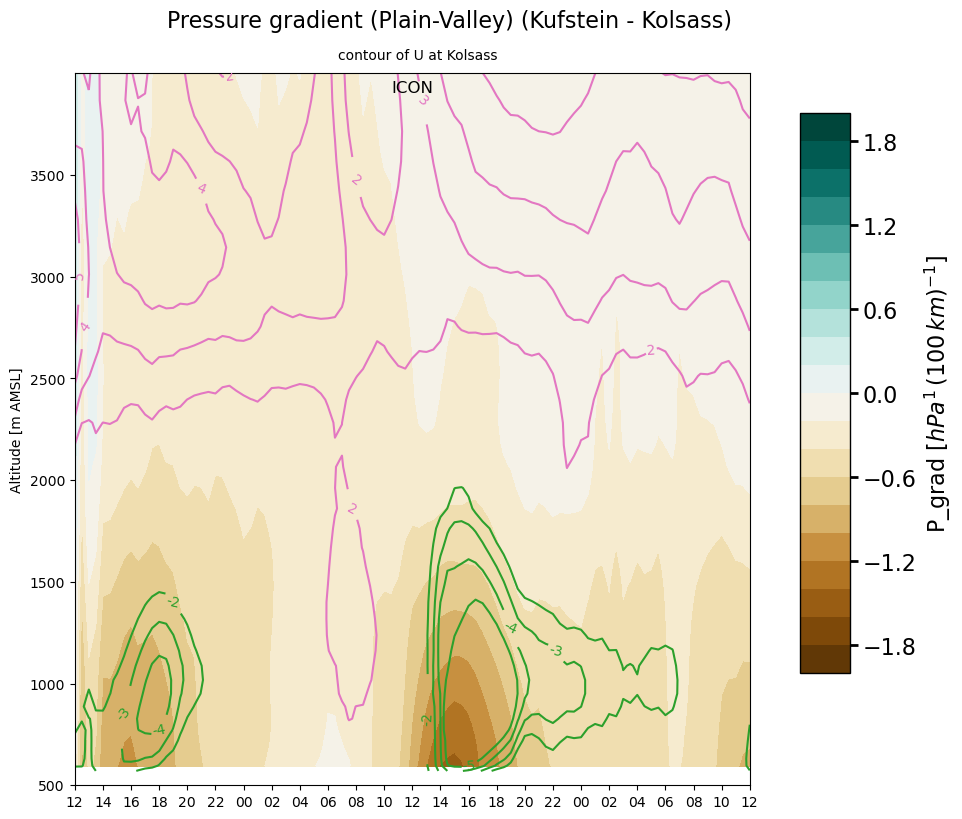

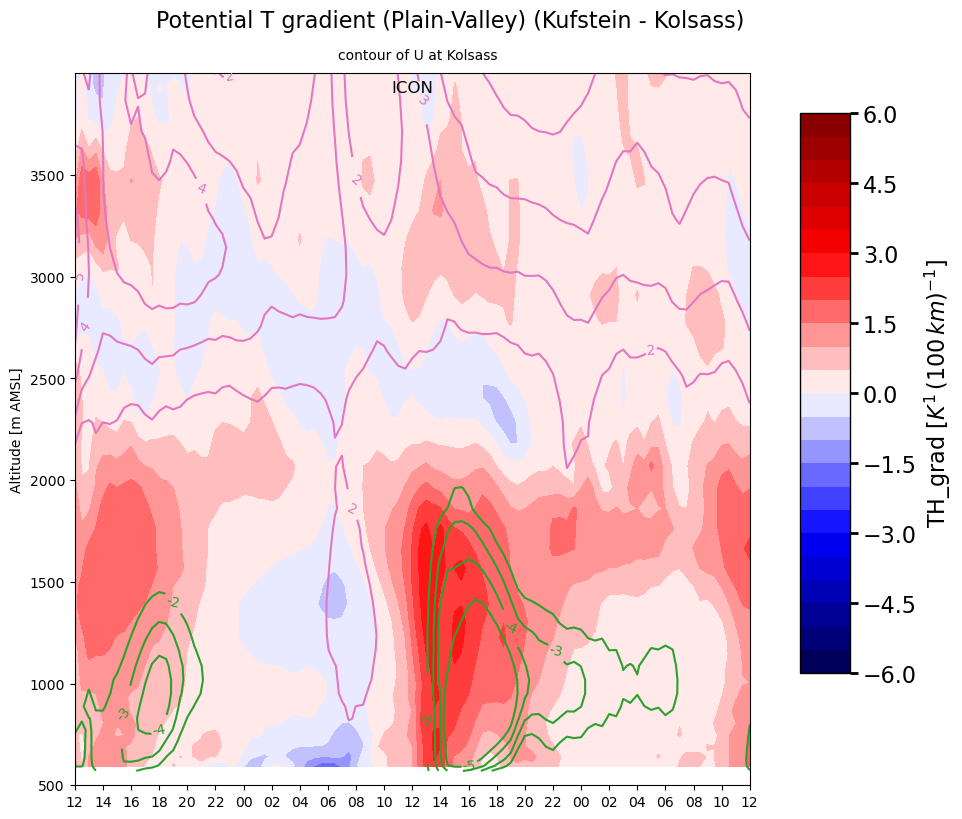

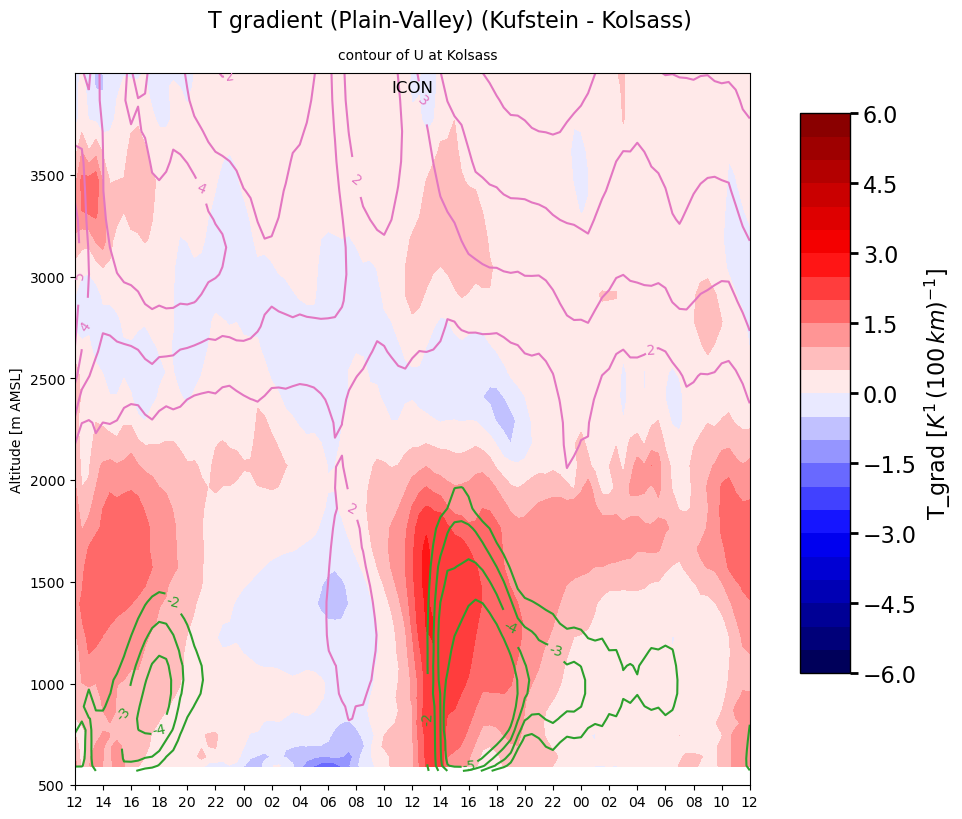

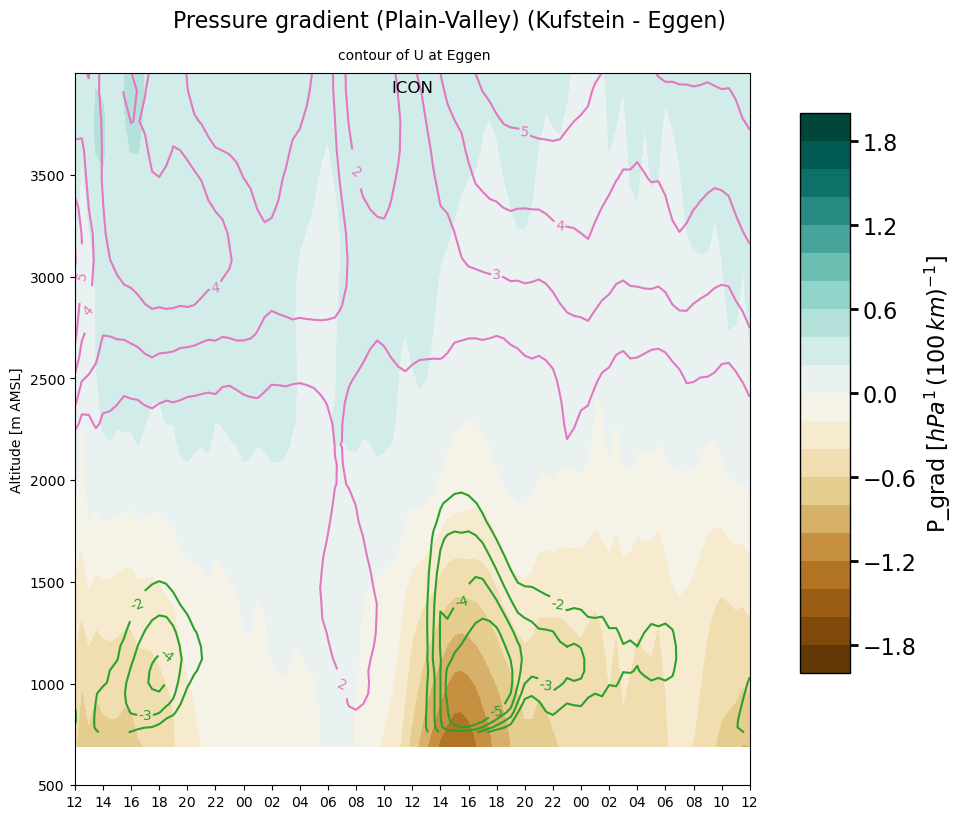

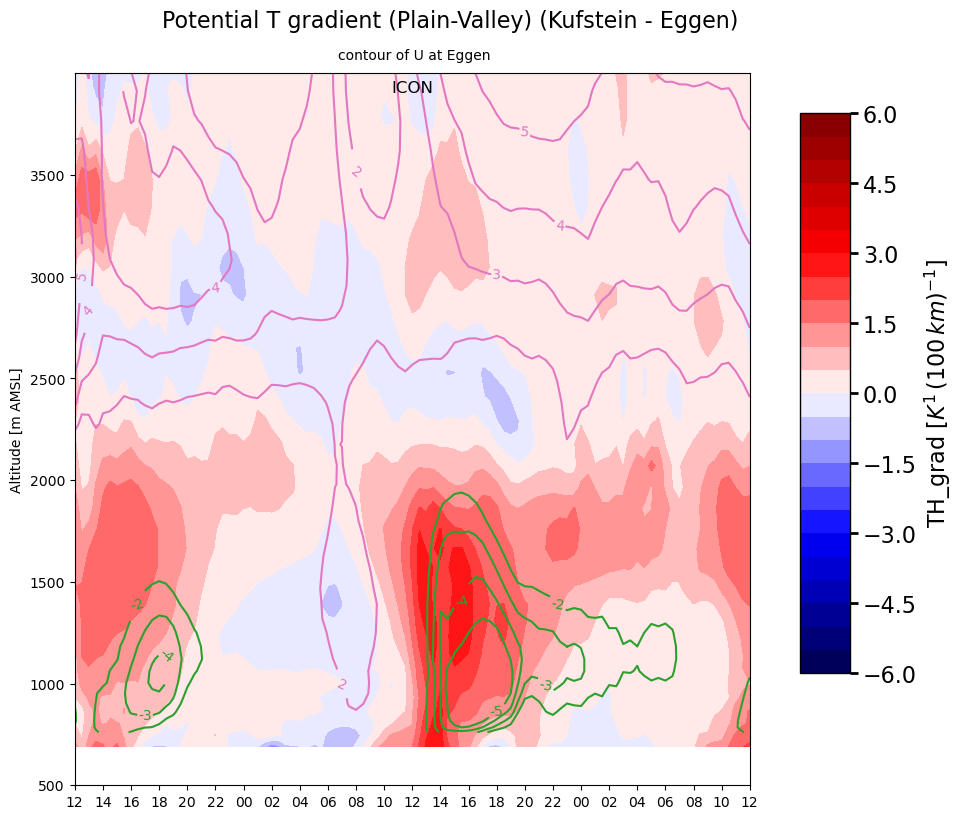

...

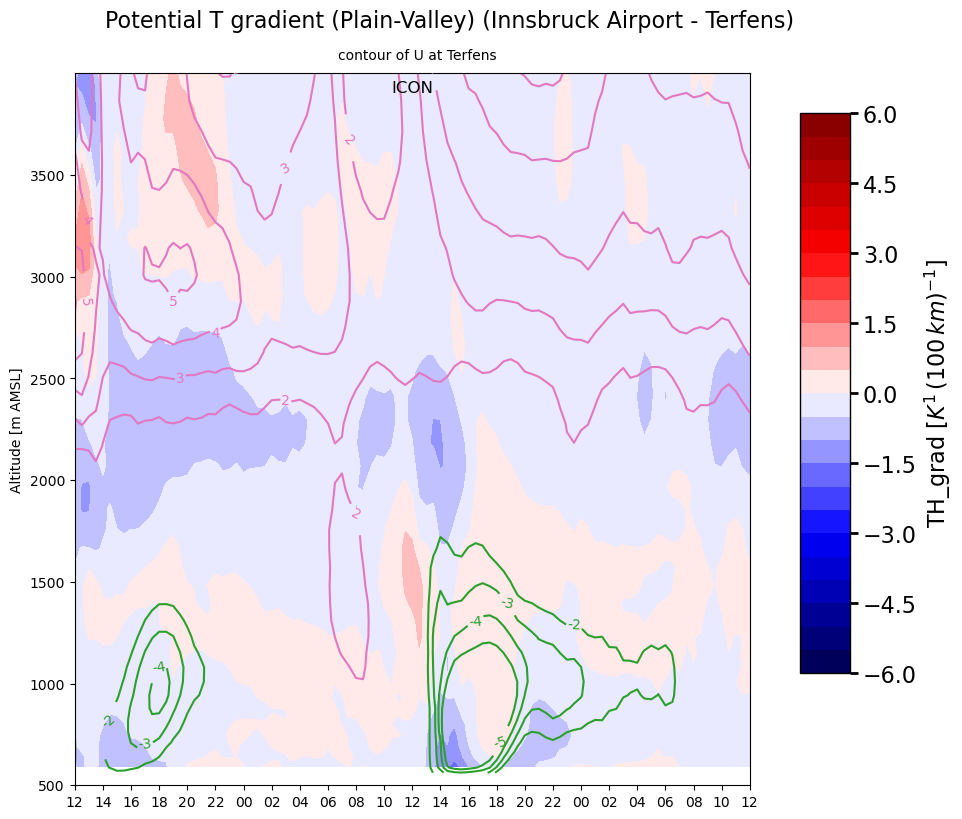

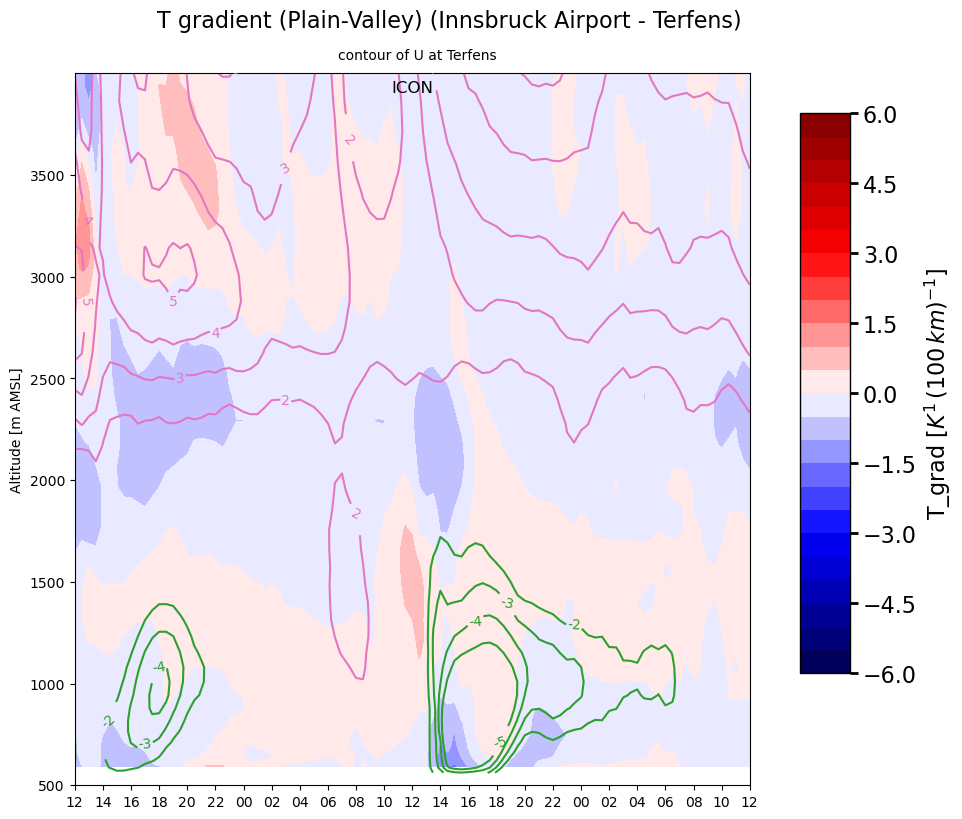

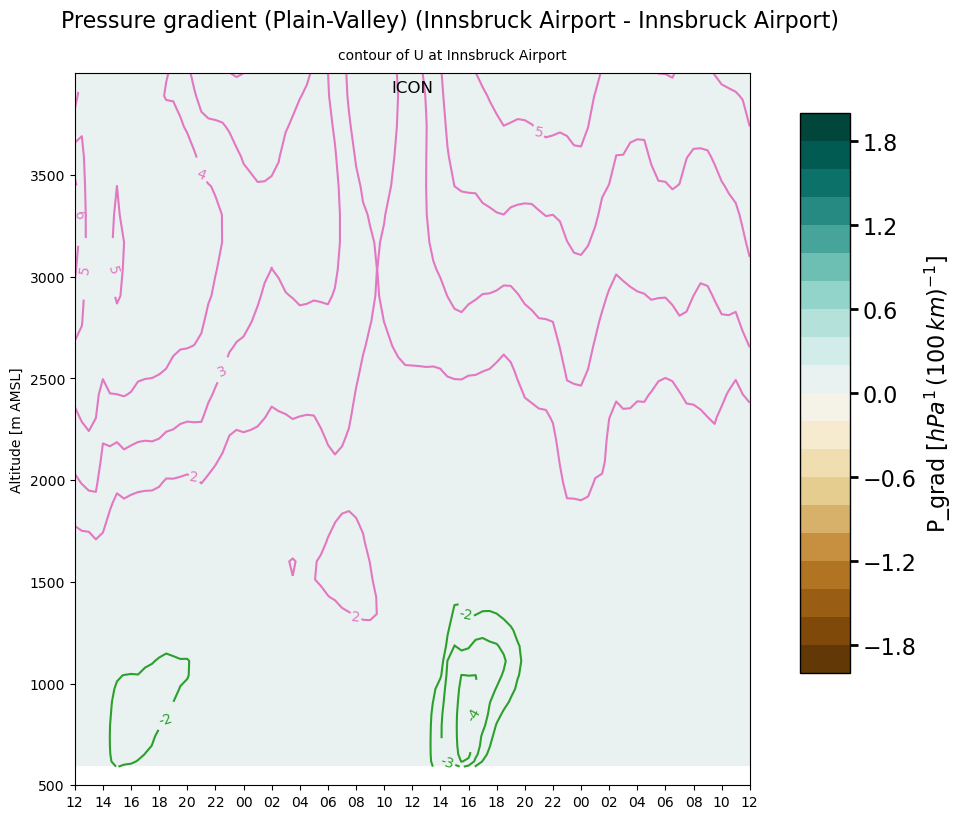

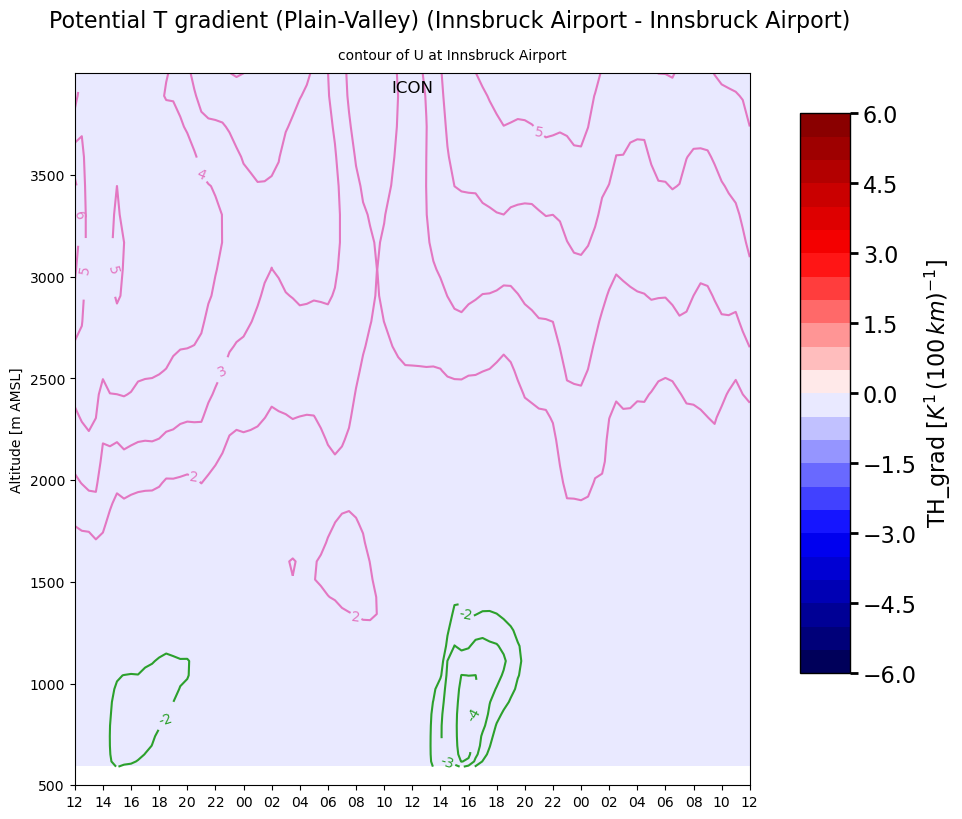

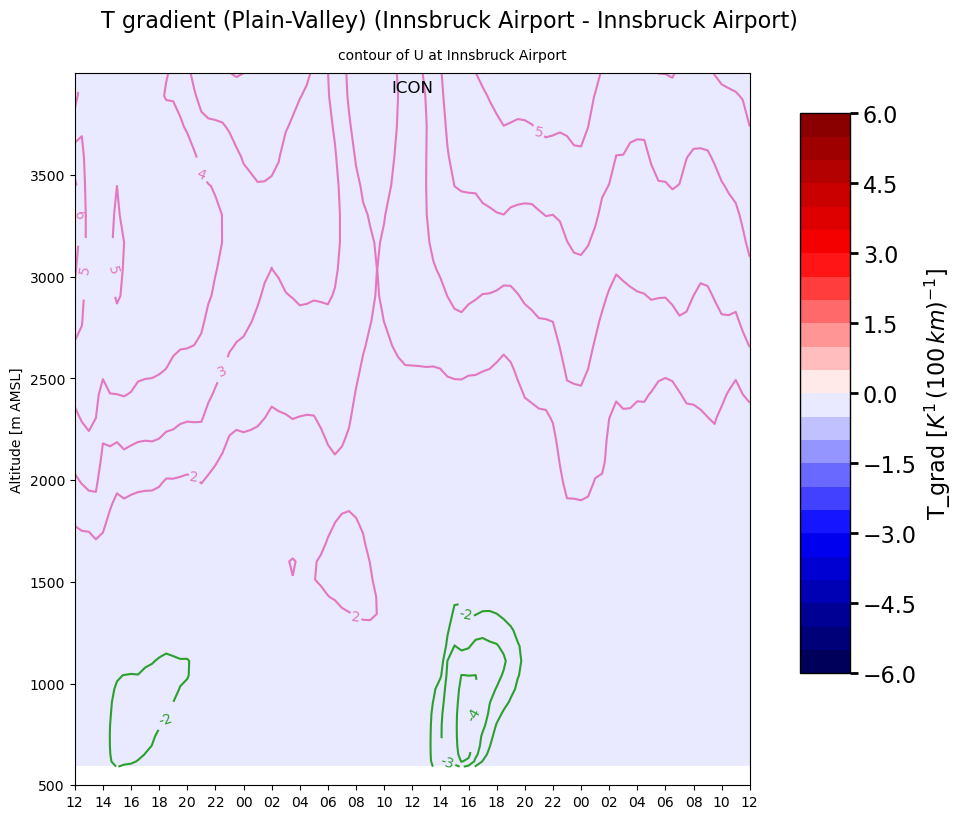

In [22]:
## LOOP for all gradient combinations and both gradients
pvars_list_plot = [vf.P_grad,vf.TH_grad,vf.T_grad]
loc_valley_list = [pc_dict['kols'],pc_dict['egg'],pc_dict['terf'],pc_dict['ifl'],]
loc_plain_list = [pc_dict['KUF'],pc_dict['ROS'],pc_dict['murs'],pc_dict['ifl'],]

for loc_p in loc_plain_list:
    for loc_v in loc_valley_list:
        
        ## COMPARE VALLEY AND PLAIN 3: model gradients for whole model time series ##
        for pvar in pvars_list:
            # make space in dataset
            htd_data_model[loc_v.short][pvar.name+'_grad']= np.zeros((len(plotdates_model),70)) 
        for counter,pdate in enumerate(plotdates_model):
            for pvar in pvars_list:
                # interpolate kols model data to murs levels
                kols_data_lm = interp1d(htd_data_model[loc_v.short][pvar.name][counter], htd_data_model[loc_v.short]['HFL_loc'], np.transpose(htd_data_model[loc_p.short]['HFL_loc'])) # lm= levels murs
                # get murs data to subtract
                murs_data_lm = np.array(htd_data_model[loc_p.short][pvar.name][counter])
                htd_data_model[loc_v.short][pvar.name+'_grad'][counter] =  kols_data_lm[3:73] - murs_data_lm[3:73] # exclude lowest 3 datapoints
                
        for pvar in pvars_list_plot:# loop over real plot variables
            # variable
            levels = np.arange(pvar.min,pvar.max+0.1,pvar.ticks)

            pvar_c = vf.U
            # levels_c =  [2,4,6,8,10,12,16]
            levels_c =  [-5,-4,-3,-2,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
            # loc_vw = pc_dict['kols']
            loc_vw = loc_v

            # vertical range
            zmin = 500
            zmax = 4000
            altitudes = np.arange(zmin,zmax,500)

            # time range
            startdate_plot = dt.datetime(2019,9,12,12,00)
            enddate_plot = dt.datetime(2019,9,14,12,00)
            plotfreq_plot = '2h0min'
            plotdates_plot = pd.date_range(startdate_plot,enddate_plot,freq=plotfreq_plot)

            # figure settings
            fig, ax1 = plt.subplots(1,1, figsize=(10,8))
            plt.subplots_adjust(bottom=0.01, right=0.8, top=0.9,hspace=0.1)
            fig.suptitle(pvar.title+' ('+loc_p.name+' - '+loc_v.name+')', fontsize=16)
            ax1.annotate('contour of '+pvar_c.name+' at '+loc_vw.name, xy=(0.42,1.17),xytext=(0.39,1.02),xycoords=('axes fraction','axes fraction'),color='k')

            # colormap
            x1 = plotdates_model
            y1 = htd_data_model['murs']['HFL_loc'][3:73]
            z1 = np.transpose(htd_data_model[loc_v.short][pvar.name])#[3:73]
            cf = ax1.contourf(x1,y1,z1, levels = levels, cmap=pvar.cmap)

            # contourlines
            y1c = htd_data_model[loc_vw.short]['HFL_loc']
            z1c = np.transpose(htd_data_model[loc_vw.short][pvar_c.name])
            ct = ax1.contour(x1,y1c,z1c,levels = levels_c, colors=['tab:green','tab:green','tab:green','tab:green','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink','tab:pink'])
            ct.clabel(fmt='%1.f', inline_spacing=1)

            # plotting options
            ax1.set_ylim(zmin,zmax)
            ax1.set_xlim(startdate_plot,enddate_plot)
            # ax1.grid()
            ax1.set_title('ICON', y=1.0, pad=-14)
            # ax1.set_xlabel('Time [h]')
            ax1.set_xticks(plotdates_plot)
            ax1.set_xticklabels(labels=[j.strftime('%H') for j in plotdates_plot])
            ax1.set_ylabel('Altitude [m AMSL]')
            ax1.set_yticks(altitudes)

            # add colorbar 
            cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
            cbar = fig.colorbar(cf, cax=cbar_ax)
            # cbar = plt.colorbar(cf,orientation='vertical')
            cbar.ax.tick_params(labelsize=16,width=2,length=6)
            cbar.set_label(pvar.name+' '+pvar.units,fontsize=16)
            cbar.outline.set_linewidth(1)

            # save
            plotpath_base = '/users/tlezuo/icon-vis/height_time_diagrams/plots/'
            plotpath = plotpath_base+str(pvar.name)+'/'
            Path(plotpath).mkdir(parents=True, exist_ok=True)
            plotname = pvar.name + loc_p.short + '_MINUS_' + loc_v.short + '_VELat_'+loc_vw.short
            plt.savefig(plotpath+plotname)